# Temperature Forecast Project 

In [1]:
# importig the necessary lbraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Reading the data set
df=pd.read_csv('temperature.csv')

In [3]:
#finding teh number of rows and columns in teh data set.
df.shape

(7752, 25)

In [4]:
# Smalll glimpse of teh data set.
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


All the given variables are of numerical type except one variable i.e date which is given as object. 

In [6]:
# finding out the null values in teh data frame.
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [7]:
# dropping the null values.
df=df.dropna()

In [8]:
#checking that all the null values have been dropped.
df.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

In [9]:
df.shape

(7588, 25)

Total number of 164(7752-7588) rows have been redused. 

### Exploratory Data Analysis (EDA)

In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
station,7588.0,13.014101,7.217858,1.000000,7.000000,13.000000,19.000000,25.000000
Present_Tmax,7588.0,29.748366,2.967401,20.000000,27.800000,29.900000,32.000000,37.600000
Present_Tmin,7588.0,23.195809,2.400880,11.300000,21.600000,23.400000,24.800000,29.900000
LDAPS_RHmin,7588.0,56.724969,14.626559,19.794666,45.960243,55.023199,67.115099,98.524734
LDAPS_RHmax,7588.0,88.360823,7.199456,58.936283,84.203724,89.784122,93.742725,100.000153
LDAPS_Tmax_lapse,7588.0,29.620128,2.943496,17.624954,27.673756,29.709537,31.711109,38.542255
LDAPS_Tmin_lapse,7588.0,23.511786,2.342579,14.272646,22.086820,23.758249,25.155660,29.619342
LDAPS_WS,7588.0,7.094097,2.177034,2.882580,5.675358,6.547838,8.028960,21.857621
LDAPS_LH,7588.0,62.492606,33.686158,-13.603212,37.206201,56.898324,84.235666,213.414006
LDAPS_CC1,7588.0,0.368510,0.262260,0.000000,0.146546,0.315706,0.574174,0.967277


median is less the mean in LDAPS_LH hence skewness might be present..There might be outliers in PPT1 to PPT4 beacuse there is a huge difference etween 75% value and the max value, same is the case with DEM & slope variables. In the variable Solar radiation the mean is less than the median hene skewness might be present.

#### ploting the distribution(count) plots of numerical data.

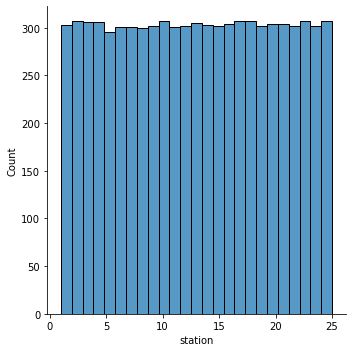

In [11]:
sns.displot(df, x='station', kind="hist", fill=True,bins=25)

From the above plot it is clear that the number of stations generating the data are approximately equal in numbers.

In [12]:
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff

In [13]:
fig = px.line(df,x = 'Date', y = ['Present_Tmax', 'Present_Tmin',], title = 'Change of Temperature with Date')
fig.show()

From the above plot it is clear that the date on which the max temp value is less the min temp value is also less as compared to other dates.

In [14]:
fig = px.line(df,x = 'Date', y = ['LDAPS_RHmax', 'LDAPS_RHmin'], title = 'Change in Relative Humidity with Date')
fig.show()

approximately when the max relative humidity values are higher the min relative humidity values are also higher or vice-versa.

In [15]:
fig = px.line(df,x = 'Date', y = ['LDAPS_CC1', 'LDAPS_CC2','LDAPS_CC3','LDAPS_CC4'], title = 'Change in Average Cloud Cover with Date')
fig.show()

Cloud coverage is almost followint the same pattern as one split values are higher then rest of allthe splits follow the same path.

In [16]:
fig = px.line(df,x = 'Date', y = ['LDAPS_PPT1', 'LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4'], title = 'Change in Precipitation with Date')
fig.show()

precipitation values are different according to the split on many dates.

In [17]:
fig = px.line(df,x = 'Date', y = ['LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse'], title = 'Change in Time Lapse with Date')
fig.show()

It follows the same pattern as followed by the Tmax and Tmin.

In [18]:
fig = px.line(df,x = 'Date', y = ['LDAPS_WS'], title = 'Change in Wind Speed with Date')
fig.show()

There are few dates where the wind speed is exceptionaly high.

In [19]:
fig = px.line(df,x = 'Date', y = ['LDAPS_LH'], title = 'Change in Latent Heat Flux with Date')
fig.show()

There are few exceptional high and lows on few dates regarding Latent Heat Flux.

In [20]:
# Plotting our Target variable 
fig = px.line(df,x = 'Date', y = ['Next_Tmax', 'Next_Tmin'], title = 'Change in Next day temperature with Date')
fig.show()

These are our target variables and folows the same patern as Tmax and Tmin.

station                AxesSubplot(0.125,0.799681;0.227941x0.0803191)
Present_Tmax        AxesSubplot(0.398529,0.799681;0.227941x0.0803191)
Present_Tmin        AxesSubplot(0.672059,0.799681;0.227941x0.0803191)
LDAPS_RHmin            AxesSubplot(0.125,0.703298;0.227941x0.0803191)
LDAPS_RHmax         AxesSubplot(0.398529,0.703298;0.227941x0.0803191)
LDAPS_Tmax_lapse    AxesSubplot(0.672059,0.703298;0.227941x0.0803191)
LDAPS_Tmin_lapse       AxesSubplot(0.125,0.606915;0.227941x0.0803191)
LDAPS_WS            AxesSubplot(0.398529,0.606915;0.227941x0.0803191)
LDAPS_LH            AxesSubplot(0.672059,0.606915;0.227941x0.0803191)
LDAPS_CC1              AxesSubplot(0.125,0.510532;0.227941x0.0803191)
LDAPS_CC2           AxesSubplot(0.398529,0.510532;0.227941x0.0803191)
LDAPS_CC3           AxesSubplot(0.672059,0.510532;0.227941x0.0803191)
LDAPS_CC4              AxesSubplot(0.125,0.414149;0.227941x0.0803191)
LDAPS_PPT1          AxesSubplot(0.398529,0.414149;0.227941x0.0803191)
LDAPS_PPT2          

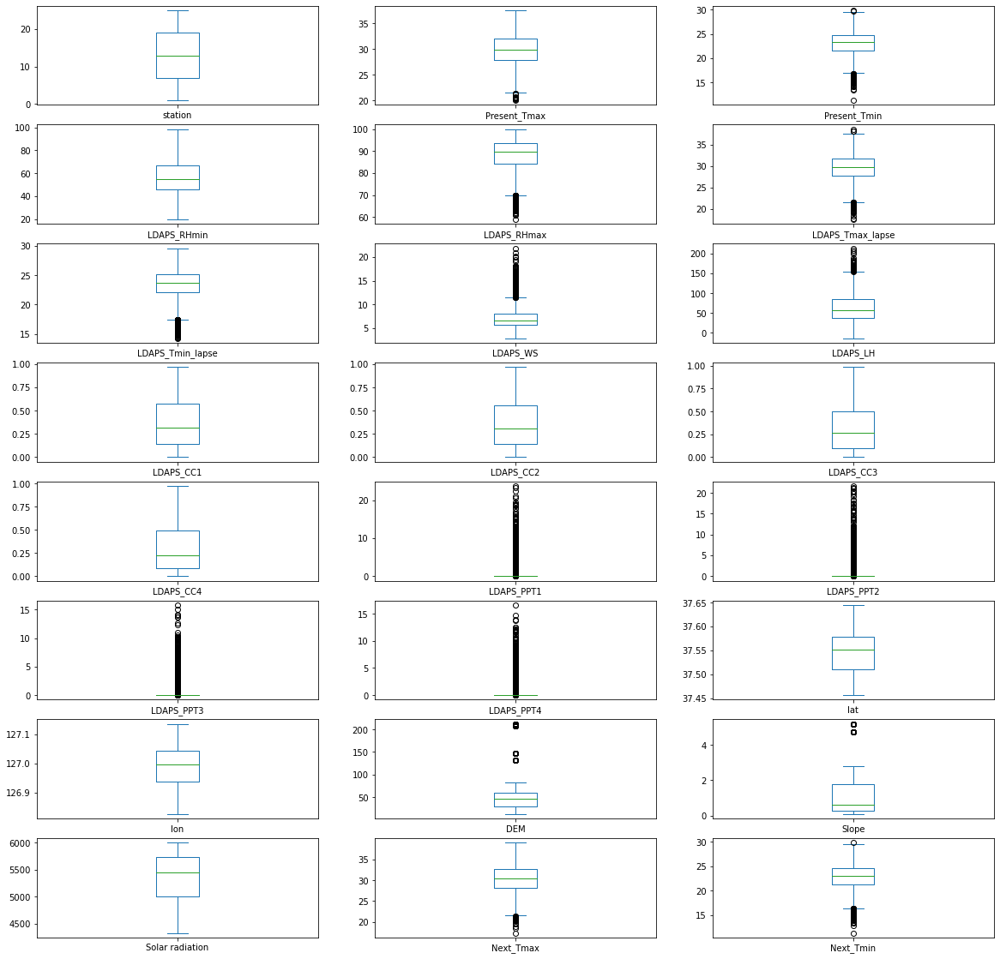

In [21]:
#Checking for outliers
df.plot(kind='box',subplots=True,layout=(8,3),figsize=(20,20))

There ae many outliers in many variables, but we are not going to remove them as the outliers per variables arebulk in numbers.
it might be because -they are not outliers. The data under those variables might follows this kind of pattern.

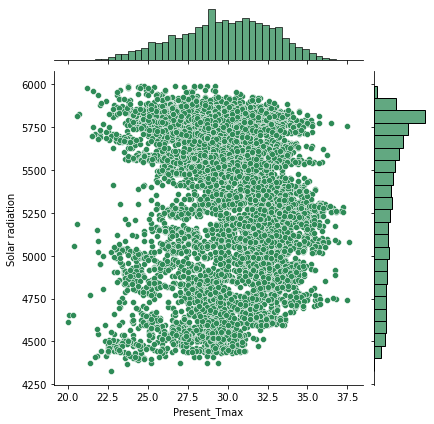

In [23]:
sns.jointplot('Present_Tmax', 'Solar radiation', df, kind='scatter', color='seagreen')

The above plot shows that here the lower values of solar radiation are related with higher temperatures

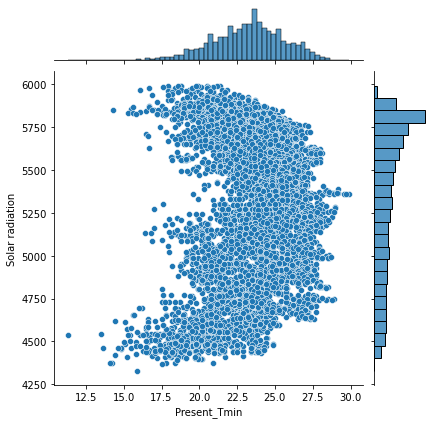

In [26]:
sns.jointplot('Present_Tmin', 'Solar radiation', df, kind='scatter')

The above plot shows that here the higher values of solar radiation are related with lower temperatures

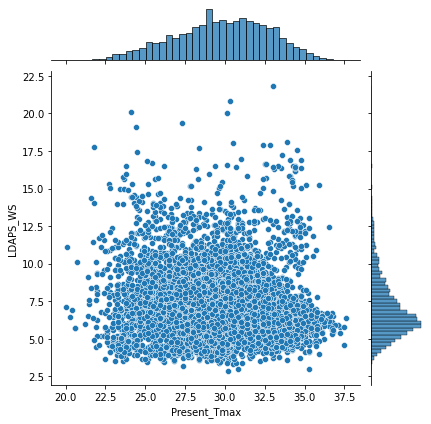

In [28]:
sns.jointplot('Present_Tmax', 'LDAPS_WS', df, kind='scatter')

The above plot shows that the lower values of wind speed are associated with higher temperature 

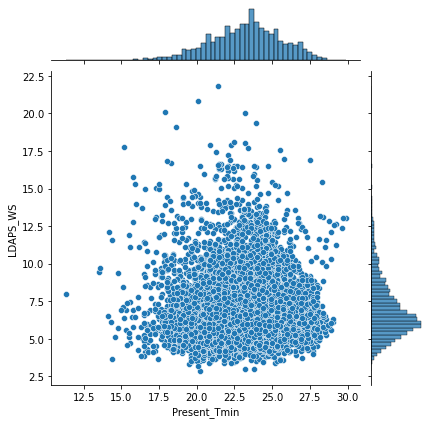

In [30]:
sns.jointplot('Present_Tmin', 'LDAPS_WS', df, kind='scatter')

The above plot shows that the higher values of wind are associated with lower temperature.

In [31]:
df.corr()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
station,1.000000,0.113301,0.133282,-0.067846,-0.169351,0.069856,0.105277,0.005822,-0.132129,0.006539,...,-0.007635,-0.013865,-0.011085,-0.239118,-0.118845,-0.256706,-0.091721,-0.021194,0.107747,0.128184
Present_Tmax,0.113301,1.000000,0.615208,-0.209059,-0.306943,0.573777,0.628705,-0.125952,0.134246,-0.316333,...,-0.104779,-0.127248,-0.107295,-0.054134,0.007695,-0.189439,-0.107079,-0.022114,0.610357,0.621048
Present_Tmin,0.133282,0.615208,1.000000,0.122200,-0.018576,0.467904,0.772061,-0.038779,-0.012817,0.084348,...,0.066207,-0.052428,-0.070391,-0.081417,-0.045174,-0.254084,-0.148423,0.059765,0.463523,0.796975
LDAPS_RHmin,-0.067846,-0.209059,0.122200,1.000000,0.578358,-0.569580,0.085237,0.289422,-0.072195,0.612831,...,0.389572,0.237512,0.167311,0.085027,-0.077590,0.100684,0.122454,0.242168,-0.446824,0.093249
LDAPS_RHmax,-0.169351,-0.306943,-0.018576,0.578358,1.000000,-0.377293,-0.118965,0.131269,0.238986,0.435937,...,0.227581,0.132436,0.118101,0.194820,0.025563,0.176557,0.219436,0.146622,-0.289788,-0.076415
LDAPS_Tmax_lapse,0.069856,0.573777,0.467904,-0.569580,-0.377293,1.000000,0.653425,-0.316011,0.043663,-0.440878,...,-0.248369,-0.193749,-0.170415,-0.044052,0.091568,-0.181433,-0.163891,0.047414,0.835729,0.589963
LDAPS_Tmin_lapse,0.105277,0.628705,0.772061,0.085237,-0.118965,0.653425,1.000000,-0.134652,-0.139675,0.008714,...,-0.002743,-0.093116,-0.103541,-0.099452,-0.024703,-0.198396,-0.187864,0.157763,0.592119,0.886513
LDAPS_WS,0.005822,-0.125952,-0.038779,0.289422,0.131269,-0.316011,-0.134652,1.000000,0.004427,0.285349,...,0.181634,0.147199,0.134428,0.033025,-0.063009,0.188540,0.169223,0.120630,-0.351107,-0.102021
LDAPS_LH,-0.132129,0.134246,-0.012817,-0.072195,0.238986,0.043663,-0.139675,0.004427,1.000000,-0.148314,...,-0.084375,0.009495,0.012372,0.133309,0.024476,0.056362,0.087517,-0.044956,0.156779,-0.060392
LDAPS_CC1,0.006539,-0.316333,0.084348,0.612831,0.435937,-0.440878,0.008714,0.285349,-0.148314,1.000000,...,0.389368,0.166763,0.088897,-0.010268,-0.007962,-0.017378,-0.023893,0.218285,-0.459705,-0.012877


<AxesSubplot:>

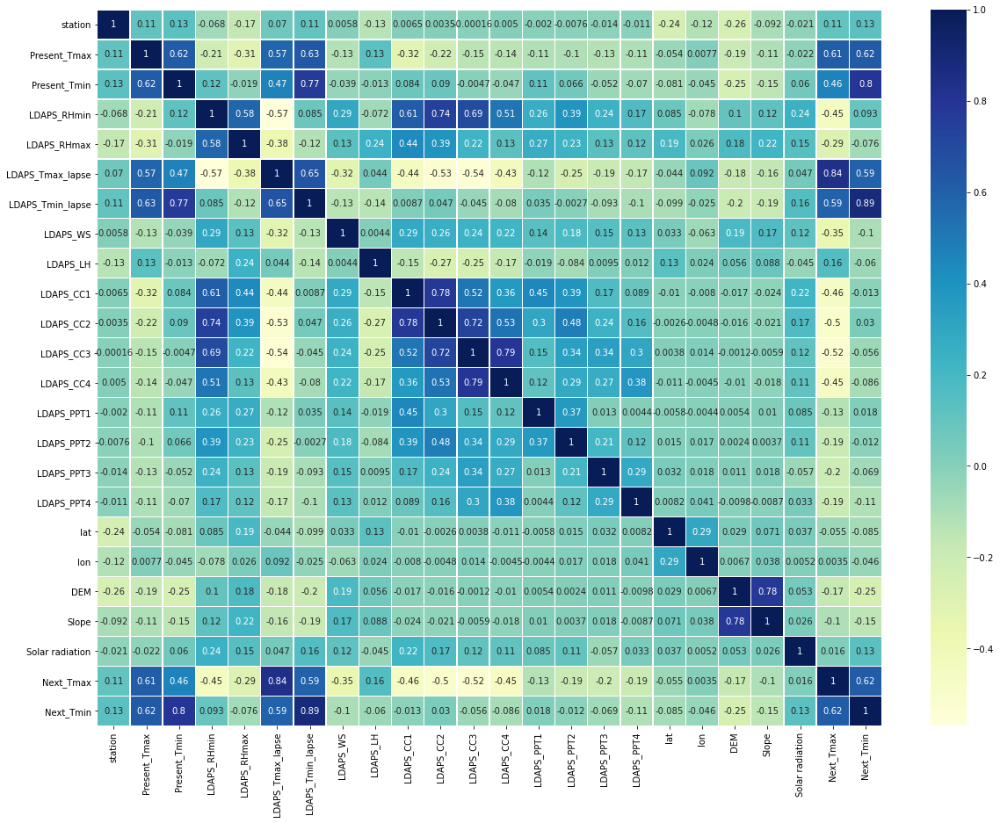

In [34]:
plt.figure(figsize=(20,15))
sns.heatmap(df.corr(), cmap='YlGnBu', annot=True, linewidths=.5)

From the above heatmap it is clear that many variables share strong correlation with other feature variables.

In [36]:
#Dropping the unnecessary columns
df.drop(['Date'],axis=1,inplace=True)

In [37]:
df.shape # reduced one column

(7588, 24)

### Seperating the feature and target variables.( As there are two target variables, hence seperating them individualy)

In [38]:
x=df.drop(['Next_Tmax','Next_Tmin'],axis=1)
y=df['Next_Tmax']
z=df['Next_Tmin']

In [39]:
print('Shape of x:',x.shape)
print('Shape of y:',y.shape)
print('Shape of z:',z.shape)

Shape of x: (7588, 22)
Shape of y: (7588,)
Shape of z: (7588,)


### Scaling the Data: Normalising

In [40]:
from sklearn.preprocessing import StandardScaler
scale=StandardScaler()
x=scale.fit_transform(x)

### Splitting the data set into training and testing part.

In [41]:
from sklearn.model_selection import train_test_split

In [43]:
xtrain,xtest,ytrain,ytest,ztrain,ztest=train_test_split(x,y,z,test_size=.30,random_state=45)
print('xtrain shape:',xtrain.shape)
print('ytrain shape:',ytrain.shape)
print('ztrain shape:',ztrain.shape)
print('xtest shape:',xtest.shape)
print('ytest shape:',ytest.shape)
print('ztest shape:',ztest.shape)

xtrain shape: (5311, 22)
ytrain shape: (5311,)
ztrain shape: (5311,)
xtest shape: (2277, 22)
ytest shape: (2277,)
ztest shape: (2277,)


### Fitting Models for target variable "Next_Tmax" i.e. y

In [44]:
# importing necessary libraries.
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge,Lasso,ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor

from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

### Fitting Regression Models

In [45]:
lr=LinearRegression()
lr.fit(xtrain,ytrain)
print('lr coef:',lr.coef_)
print('lr intercept:',lr.intercept_)
pred=lr.predict(xtest)
print('lr score:',lr.score(xtest,ytest))

lr coef: [ 0.12982452  0.42978495 -0.00316775  0.35840763 -0.00302926  1.84788796
  0.28305734 -0.31943072  0.2661106  -0.31071358 -0.15884728 -0.21028007
 -0.29857338 -0.02795591  0.23303702 -0.05059987 -0.00885053 -0.03752284
 -0.14698496 -0.25786221  0.26860139  0.03251739]
lr intercept: 30.245303743627606
lr score: 0.7731437919150451


In [46]:
rdg=Ridge(alpha=0.0001, random_state=45)
rdg.fit(xtrain,ytrain)
print('Ridge score:',rdg.score(xtrain,ytrain))
predict=rdg.predict(xtest)
print('r2_score:',r2_score(ytest,predict))

Ridge score: 0.7849385485422216
r2_score: 0.7731437919771728


In [47]:
lso=Lasso(alpha=.0001,random_state=45)
lso.fit(xtrain,ytrain)
print('Lasso score:',lso.score(xtrain,ytrain))
predict1=lso.predict(xtest)
print('r2 score:',r2_score(ytest,predict1))

Lasso score: 0.7849384970923063
r2 score: 0.7731488946074604


In [48]:
en=ElasticNet(alpha=0.0001, random_state=45)
en.fit(xtrain,ytrain)
print('ElasticNet score:',en.score(xtrain,ytrain))
predict2=en.predict(xtest)
print('r2 score:',r2_score(ytest,predict2))

ElasticNet score: 0.784938520385063
r2 score: 0.7731465313631887


In [49]:
dtr=DecisionTreeRegressor(criterion='mse')
dtr.fit(xtrain,ytrain)
print('dtr score:',dtr.score(xtrain,ytrain))

dtrpredict=dtr.predict(xtest)
print('dtr r2_score:', r2_score(ytest,dtrpredict))

print("Mean absolute error is=",mean_absolute_error(ytest,dtrpredict))
print("Mean squared error of dtr = ", mean_squared_error(ytest,dtrpredict))
print("Root Mean squared error of dtr = ",np.sqrt(mean_squared_error(ytest,dtrpredict)))

dtr score: 1.0
dtr r2_score: 0.7779434121254205
Mean absolute error is= 1.0383399209486166
Mean squared error of dtr =  2.130808080808081
Root Mean squared error of dtr =  1.459728769603477


In [50]:
# k=5
knr=KNeighborsRegressor(n_neighbors=5)
knr.fit(xtrain,ytrain)
print('knr score:',knr.score(xtrain,ytrain))

knrpredict=knr.predict(xtest)
print('knr r2_score:',r2_score(ytest,knrpredict))

print("Mean absolute error is=",mean_absolute_error(ytest,knrpredict))
print("Mean squareed error of knr =",mean_squared_error(ytest,knrpredict))
print("Root Mean squared error of knr=",np.sqrt(mean_squared_error(ytest,knrpredict)))

knr score: 0.8912088325394942
knr r2_score: 0.8310255111865572
Mean absolute error is= 0.962591128678085
Mean squareed error of knr = 1.6214434782608695
Root Mean squared error of knr= 1.2733591316910047


In [51]:
# k=10
knr=KNeighborsRegressor(n_neighbors=10)
knr.fit(xtrain,ytrain)
print('knr score:',knr.score(xtrain,ytrain))

knrpredict=knr.predict(xtest)
print('knr r2_score:',r2_score(ytest,knrpredict))

print("Mean absolute error is=",mean_absolute_error(ytest,knrpredict))
print("Mean squareed error of knr =",mean_squared_error(ytest,knrpredict))
print("Root Mean squared error of knr=",np.sqrt(mean_squared_error(ytest,knrpredict)))

knr score: 0.8640680768724831
knr r2_score: 0.8212385038633192
Mean absolute error is= 0.993522178304787
Mean squareed error of knr = 1.7153575318401408
Root Mean squared error of knr= 1.3097165845480239


In [52]:
# k=3
knr=KNeighborsRegressor(n_neighbors=3)
knr.fit(xtrain,ytrain)
print('knr score:',knr.score(xtrain,ytrain))

knrpredict=knr.predict(xtest)
print('knr r2_score:',r2_score(ytest,knrpredict))

print("Mean absolute error is=",mean_absolute_error(ytest,knrpredict))
print("Mean squareed error of knr =",mean_squared_error(ytest,knrpredict))
print("Root Mean squared error of knr=",np.sqrt(mean_squared_error(ytest,knrpredict)))

knr score: 0.9128717834483405
knr r2_score: 0.8210789378370729
Mean absolute error is= 0.9669448104230713
Mean squareed error of knr = 1.7168886937002883
Root Mean squared error of knr= 1.3103009935508285


In [53]:
sgd=SGDRegressor()
sgd.fit(xtrain,ytrain)
print('sgd score:',sgd.score(xtrain,ytrain))

sgd1predict=sgd.predict(xtest)
print('sgd r2_score:', r2_score(ytest,sgd1predict))

print("Mean absolute error is=",mean_absolute_error(ytest,sgd1predict))
print("Mean squared error of sgd=",mean_squared_error(ytest,sgd1predict))
print("Root Mean squared error of sgd=",np.sqrt(mean_squared_error(ytest,sgd1predict)))

sgd score: 0.7841065919352782
sgd r2_score: 0.7725505364195406
Mean absolute error is= 1.1182544521769255
Mean squared error of sgd= 2.1825569761814205
Root Mean squared error of sgd= 1.4773479536593337


From the above model fitting it is found that KNeighbors with n_neighbors=5 gives the best scores as r2 score of 83% and RMSE of 1.27.Now going for Ensemble techniqes to improve upon the model fitting.

### Ensemble Techniques

In [54]:
rfr=RandomForestRegressor()
rfr.fit(xtrain,ytrain)
print('rfr score:',rfr.score(xtrain,ytrain))

rfr1predict=rfr.predict(xtest)
print('rfr r2_score:', r2_score(ytest,rfr1predict))

print("Mean absolute error is=",mean_absolute_error(ytest,rfr1predict))
print("Mean squared error of rfr=",mean_squared_error(ytest,rfr1predict))
print("Root Mean squared error of rfr=",np.sqrt(mean_squared_error(ytest,rfr1predict)))

rfr score: 0.9850307274901121
rfr r2_score: 0.897444724528897
Mean absolute error is= 0.7351747913921822
Mean squared error of rfr= 0.9840987461572238
Root Mean squared error of rfr= 0.9920175130294948


In [55]:
abr=AdaBoostRegressor()
abr.fit(xtrain,ytrain)
print('abr score:',abr.score(xtrain,ytrain))

abr1predict=abr.predict(xtest)
print('abr r2_score:', r2_score(ytest,abr1predict))

print("Mean absolute error is=",mean_absolute_error(ytest,abr1predict))
print("Mean squared error of abr=",mean_squared_error(ytest,abr1predict))
print("Root Mean squared error of abr=",np.sqrt(mean_squared_error(ytest,abr1predict)))

abr score: 0.775263085457268
abr r2_score: 0.7594822589301264
Mean absolute error is= 1.2222098916418003
Mean squared error of abr= 2.307957404708287
Root Mean squared error of abr= 1.5191963022296648


Out of the above two fitted two models random forrest regressor is giving the best scores as r2 score of 89.74 % and RMSE score as 0.99. Hence going for cross validation of KNeighbors and Random Forest Regressor

### Cross Validation

In [58]:
score=cross_val_score(knr,xtrain,ytrain,cv=10)
print(score)
print(score.mean())
print(score.std())

[0.83101096 0.80637739 0.81940781 0.82385156 0.84761242 0.81843426
 0.83035719 0.81194205 0.81918973 0.77949744]
0.8187680794156463
0.01698540195844567


In [59]:
score=cross_val_score(rfr,xtrain,ytrain,cv=5)
print(score)
print(score.mean())
print(score.std())

[0.88809228 0.8967534  0.88799962 0.88398916 0.88178739]
0.8877243716701984
0.005117303023480015


Teh cross validation scores of Random Forest Regressor are 88% with very low standard deviation hence going for Hyper Parametric Tunning of RFR.

### Hyper Parametric Tunning

In [60]:
param_grid = {  'bootstrap': [True], 
              'max_depth': [5, 10, None], 
              'max_features': ['auto', 'log2','sqrt',None], 
              'n_estimators': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]}

In [61]:
g_search = GridSearchCV(estimator = rfr, 
                        param_grid = param_grid, 
                        cv = 3, 
                        n_jobs = 1,
                        verbose = 0, 
                        return_train_score=True)

In [62]:
g_search.fit(xtrain, ytrain);

In [63]:
print(g_search.best_params_)

{'bootstrap': True, 'max_depth': None, 'max_features': 'sqrt', 'n_estimators': 100}


In [64]:
modelrfr=RandomForestRegressor(bootstrap= True, max_depth= None, max_features= 'sqrt', n_estimators=100 )
modelrfr.fit(xtrain,ytrain)
print('modelrfr score:',modelrfr.score(xtrain,ytrain))

modelrfr1predict=modelrfr.predict(xtest)
print('modelrfr r2_score:', r2_score(ytest,modelrfr1predict))

print("Mean absolute error is=",mean_absolute_error(ytest,modelrfr1predict))
print("Mean squared error of rfr=",mean_squared_error(ytest,modelrfr1predict))
print("Root Mean squared error of rfr=",np.sqrt(mean_squared_error(ytest,modelrfr1predict)))

modelrfr score: 0.9864430009892698
modelrfr r2_score: 0.9044039085179642
Mean absolute error is= 0.7200210803689066
Mean squared error of rfr= 0.9173198875713661
Root Mean squared error of rfr= 0.9577681804963903


After Hyper parametric tunning the score of the RFR model improves as r2 score of 90.44% and RMSE as 0.95

### Saving th Best model 

In [65]:
import joblib

joblib.dump(modelrfr,'rfr_temperature_prediction_model.obj')

rfrloadmodel=joblib.load('rfr_temperature_prediction_model.obj')
pred=rfrloadmodel.predict(xtest)
print(pred)

[27.894 29.33  34.936 ... 30.657 26.921 29.978]


In [67]:
predicted_values=pd.DataFrame({'Actual':ytest,'Predicted':pred})

In [68]:
predicted_values

,Actual,Predicted
7748,28.6,27.894
6951,25.9,29.330
7135,34.5,34.936
1488,27.0,27.517
6298,32.0,31.340
...,...,...
7580,31.9,32.127
2486,26.7,27.823
4264,31.5,30.657
7662,26.6,26.921


### Fitting Models for target variable "Next_Tmin" i.e. z

In [70]:
lrmin=LinearRegression()
lrmin.fit(xtrain,ztrain)
print('lr coef:',lrmin.coef_)
print('lr intercept:',lrmin.intercept_)
pred=lrmin.predict(xtest)
print('lr score:',lrmin.score(xtest,ztest))

lr coef: [-0.01634352  0.07315268  0.56409589  0.25096589  0.03613217  0.25949727
  1.52272944  0.05224697  0.03491563 -0.1408629   0.11542254 -0.08200749
  0.01257071 -0.05823613 -0.05265666  0.05440952 -0.09071935 -0.03890273
 -0.06408356 -0.4281785   0.34104237  0.01835615]
lr intercept: 22.910866173882795
lr score: 0.8364639919758503


In [71]:
rdgmin=Ridge(alpha=0.0001, random_state=45)
rdgmin.fit(xtrain,ztrain)
print('Ridge score:',rdgmin.score(xtrain,ztrain))
predict=rdgmin.predict(xtest)
print('r2_score:',r2_score(ztest,predict))

Ridge score: 0.8354414070782107
r2_score: 0.8364639925519767


In [72]:
lsomin=Lasso(alpha=.0001,random_state=45)
lsomin.fit(xtrain,ztrain)
print('Lasso score:',lsomin.score(xtrain,ztrain))
predict1=lsomin.predict(xtest)
print('r2 score:',r2_score(ztest,predict1))

Lasso score: 0.8354413074759364
r2 score: 0.836476438057244


In [73]:
enmin=ElasticNet(alpha=0.0001, random_state=45)
enmin.fit(xtrain,ztrain)
print('ElasticNet score:',enmin.score(xtrain,ztrain))
predict2=enmin.predict(xtest)
print('r2 score:',r2_score(ztest,predict2))

ElasticNet score: 0.8354413712592226
r2 score: 0.8364717596791607


In [74]:
dtrmin=DecisionTreeRegressor(criterion='mse')
dtrmin.fit(xtrain,ztrain)
print('dtr score:',dtrmin.score(xtrain,ztrain))

dtrminpredict=dtrmin.predict(xtest)
print('dtr r2_score:', r2_score(ztest,dtrminpredict))

print("Mean absolute error is=",mean_absolute_error(ztest,dtrminpredict))
print("Mean squared error of dtr = ", mean_squared_error(ztest,dtrminpredict))
print("Root Mean squared error of dtr = ",np.sqrt(mean_squared_error(ztest,dtrminpredict)))

dtr score: 1.0
dtr r2_score: 0.769466261659022
Mean absolute error is= 0.8697408871321916
Mean squared error of dtr =  1.3888801054018447
Root Mean squared error of dtr =  1.1785075754537366


In [75]:
# k=5
knrmin=KNeighborsRegressor(n_neighbors=5)
knrmin.fit(xtrain,ztrain)
print('knr score:',knrmin.score(xtrain,ztrain))

knrminpredict=knrmin.predict(xtest)
print('knr r2_score:',r2_score(ztest,knrminpredict))

print("Mean absolute error is=",mean_absolute_error(ztest,knrminpredict))
print("Mean squareed error of knr =",mean_squared_error(ztest,knrminpredict))
print("Root Mean squared error of knr=",np.sqrt(mean_squared_error(ztest,knrminpredict)))

knr score: 0.9050862433436884
knr r2_score: 0.8541264252834577
Mean absolute error is= 0.7132454984628898
Mean squareed error of knr = 0.8788340799297321
Root Mean squared error of knr= 0.937461508505673


In [76]:
# k=10
knrmin=KNeighborsRegressor(n_neighbors=10)
knrmin.fit(xtrain,ztrain)
print('knr score:',knrmin.score(xtrain,ztrain))

knrminpredict=knrmin.predict(xtest)
print('knr r2_score:',r2_score(ztest,knrminpredict))

print("Mean absolute error is=",mean_absolute_error(ztest,knrminpredict))
print("Mean squareed error of knr =",mean_squared_error(ztest,knrminpredict))
print("Root Mean squared error of knr=",np.sqrt(mean_squared_error(ztest,knrminpredict)))

knr score: 0.880866433346014
knr r2_score: 0.8475580565643799
Mean absolute error is= 0.7302854633289416
Mean squareed error of knr = 0.9184060606060608
Root Mean squared error of knr= 0.9583350461117764


In [77]:
# k=3
knrmin=KNeighborsRegressor(n_neighbors=3)
knrmin.fit(xtrain,ztrain)
print('knr score:',knrmin.score(xtrain,ztrain))

knrminpredict=knrmin.predict(xtest)
print('knr r2_score:',r2_score(ztest,knrminpredict))

print("Mean absolute error is=",mean_absolute_error(ztest,knrminpredict))
print("Mean squareed error of knr =",mean_squared_error(ztest,knrminpredict))
print("Root Mean squared error of knr=",np.sqrt(mean_squared_error(ztest,knrminpredict)))

knr score: 0.9227060241760452
knr r2_score: 0.8483068284021791
Mean absolute error is= 0.7098082271995316
Mean squareed error of knr = 0.9138949885326697
Root Mean squared error of knr= 0.9559785502471642


In [78]:
sgdmin=SGDRegressor()
sgdmin.fit(xtrain,ztrain)
print('sgd score:',sgdmin.score(xtrain,ztrain))

sgd1minpredict=sgdmin.predict(xtest)
print('sgd r2_score:', r2_score(ztest,sgd1minpredict))

print("Mean absolute error is=",mean_absolute_error(ztest,sgd1minpredict))
print("Mean squared error of sgd=",mean_squared_error(ztest,sgd1minpredict))
print("Root Mean squared error of sgd=",np.sqrt(mean_squared_error(ztest,sgd1minpredict)))

sgd score: 0.8346677426195244
sgd r2_score: 0.8349459746053646
Mean absolute error is= 0.7800896205171894
Mean squared error of sgd= 0.9943891676628915
Root Mean squared error of sgd= 0.9971906375728221


From the above model fitting it is found that KNeighbors with n_neighbors=5 gives the best scores as r2 score of 85.41% and RMSE of 0.93. Now going for Ensemble techniqes to improve upon the model fitting.

### Ensemble Techniques

In [79]:
rfrmin=RandomForestRegressor()
rfrmin.fit(xtrain,ztrain)
print('rfr score:',rfrmin.score(xtrain,ztrain))

rfr1minpredict=rfrmin.predict(xtest)
print('rfr r2_score:', r2_score(ztest,rfr1minpredict))

print("Mean absolute error is=",mean_absolute_error(ztest,rfr1minpredict))
print("Mean squared error of rfr=",mean_squared_error(ztest,rfr1minpredict))
print("Root Mean squared error of rfr=",np.sqrt(mean_squared_error(ztest,rfr1minpredict)))

rfr score: 0.9866615303041503
rfr r2_score: 0.9010378629611814
Mean absolute error is= 0.5848296003513395
Mean squared error of rfr= 0.5962101005709269
Root Mean squared error of rfr= 0.7721464243075448


In [80]:
abrmin=AdaBoostRegressor()
abrmin.fit(xtrain,ztrain)
print('abr score:',abrmin.score(xtrain,ztrain))

abr1minpredict=abrmin.predict(xtest)
print('abr r2_score:', r2_score(ztest,abr1minpredict))

print("Mean absolute error is=",mean_absolute_error(ztest,abr1minpredict))
print("Mean squared error of abr=",mean_squared_error(ztest,abr1minpredict))
print("Root Mean squared error of abr=",np.sqrt(mean_squared_error(ztest,abr1minpredict)))

abr score: 0.8211179839166665
abr r2_score: 0.817920981185627
Mean absolute error is= 0.8349848246849005
Mean squared error of abr= 1.0969584263988823
Root Mean squared error of abr= 1.047357831115461


Out of the above two fitted two models random forest regressor is giving the best scores as r2 score of 90% and RMSE score as 0.77. Hence going for cross validation of KNeighbors and Random Forest Regressor

### Cross Validation 

In [81]:
score=cross_val_score(knrmin,xtrain,ytrain,cv=10)
print(score)
print(score.mean())
print(score.std())

[0.83101096 0.80637739 0.81940781 0.82385156 0.84761242 0.81843426
 0.83035719 0.81194205 0.81918973 0.77949744]
0.8187680794156463
0.01698540195844567


In [82]:
score=cross_val_score(rfrmin,xtrain,ytrain,cv=5)
print(score)
print(score.mean())
print(score.std())

[0.88796576 0.89763795 0.8888066  0.88383621 0.88249603]
0.888148508168776
0.00531154158945852


The cross validation scores of Random Forest Regressor are 88.81% with very-very low standard deviation hence going for Hyper Parametric Tunning of RFR.

### Hyper Parametric Tunning

In [83]:
param_gridmin = {  'bootstrap': [True], 
              'max_depth': [5, 10, None], 
              'max_features': ['auto', 'log2','sqrt',None], 
              'n_estimators': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]}

In [87]:
g_searchmin = GridSearchCV(estimator = rfrmin, 
                        param_grid = param_gridmin, 
                        cv = 3, 
                        n_jobs = 1,
                        verbose = 0, 
                        return_train_score=True)

In [88]:
g_searchmin.fit(xtrain, ytrain);

In [86]:
print(g_searchmin.best_params_)

{'bootstrap': True, 'max_depth': None, 'max_features': 'sqrt', 'n_estimators': 100}


In [90]:
modelrfrmin=RandomForestRegressor(bootstrap= True, max_depth= None, max_features= 'sqrt', n_estimators=100 )
modelrfrmin.fit(xtrain,ztrain)
print('modelrfr score:',modelrfrmin.score(xtrain,ztrain))

modelrfr1minpredict=modelrfrmin.predict(xtest)
print('modelrfr r2_score:', r2_score(ztest,modelrfr1minpredict))

print("Mean absolute error is=",mean_absolute_error(ztest,modelrfr1minpredict))
print("Mean squared error of rfr=",mean_squared_error(ztest,modelrfr1minpredict))
print("Root Mean squared error of rfr=",np.sqrt(mean_squared_error(ztest,modelrfr1minpredict)))

modelrfr score: 0.9871653640935691
modelrfr r2_score: 0.9120172819201993
Mean absolute error is= 0.5566324110671937
Mean squared error of rfr= 0.5300631813790074
Root Mean squared error of rfr= 0.7280543807841605


After Hyper parametric tunning the score of the RFR model improves as r2 score of 91.20% and RMSE as 0.72

### Saving the best Model 

In [92]:
import joblib

joblib.dump(modelrfrmin,'rfr_mintemperature_prediction_model.obj')

rfrminloadmodel=joblib.load('rfr_mintemperature_prediction_model.obj')
predmin=rfrminloadmodel.predict(xtest)
print(predmin)

[17.94  23.645 26.389 ... 23.086 18.426 19.961]


In [93]:
predicted_values=pd.DataFrame({'Actual':ztest,'Predicted':predmin})

In [94]:
predicted_values

,Actual,Predicted
7748,18.8,17.940
6951,23.4,23.645
7135,26.8,26.389
1488,23.9,23.574
6298,23.9,23.265
...,...,...
7580,23.4,22.683
2486,20.9,20.520
4264,20.7,23.086
7662,18.6,18.426
